# PCA on Implied Volatility Surfaces: A Dimensionality Reduction Approach

## 1. **Motivation**

- Options prices are driven by different risk factors, primarily delta and implied volatility (IV).
- IV is not directly observable and encodes deviations from the assumed log-normal return distribution.
- Hedging IV-related risk requires understanding the covariance structure of IV movements.
- Challenges in estimating IV covariance matrices:
  - Measurement noise and bid-ask spreads.
  - Large dimensionality due to multiple strikes and expirations.

## 2. **A Proposed Solution: Dimensionality Reduction**

1. Reduce the dimensionality of the IV surface.
2. Compute the covariance matrix in reduced space.
3. Reconstruct a covariance matrix from the lower-rank factor structure.

## 3. **Simple PCA on Implied Volatility Surfaces**

### **Step 1: Data Acquisition & Preprocessing**

- Pull precomputed IV surfaces from the OptionMetrics database.
  - Identify data anomalies (e.g., IV discrepancies between puts and calls).
  - Justify using only out-of-the-money (OTM) options due to tighter spreads.
  - Discuss the OptionMetrics methodology for generating IV values.
- **Visualization:**
  - 3D plot of IV values interpolated across time-to-maturity and delta.

### **Step 2: IV Surface Exploration**

- Show IV curves across multiple dates and products.
- Identify common patterns in IV movements.

### **Step 3: Running PCA on IV Data**

- Construct the IV data matrix for PCA.
- **PCA component interpretation:**
  - First component: Level shifts.
  - Second component: Skew (slope).
  - Third component: Kurtosis (curvature).
  - Fourth component: Higher-order effects.
- **Efficiency considerations:**
  - Compare true SVD vs. randomized SVD implementations.
- **Weighting considerations:**
  - Should we use Vega-weighted covariance matrices?
  - Would results be more generalizable in IV space, applying Vega-weighting only in risk applications?

### **Step 4: Do OLS ON the PCA Data for Prediciton**

... explain

## 4. **Extensions Beyond PCA**

### **1) Functional PCA (FPCA)**

- Parameterizes IV as a function of delta and time-to-maturity.
- Captures additional covariance information between nearby points.

### **2) Instrumented PCA (IPCA)**

- IPCA extends traditional PCA by allowing factor loadings to depend on observable characteristics.
- This enables dynamic adjustments in factor structures based on exogenous variables such as earnings risks, dividend risks, and macroeconomic indicators.
- For example, implied volatility surfaces may exhibit different factor structures around earnings announcements due to shifts in uncertainty and investor sentiment.
- By conditioning on these variables, IPCA provides a more flexible decomposition of implied volatility risk.
- A key question: Can lagged IV surfaces serve as relevant instruments to capture time-dependent market behavior?

### **3) Autoencoders for IV Decomposition**

- Captures nonlinear relationships in IV dynamics.
- Analogous to feature extraction in IV space, allowing for capturing latent structures beyond simple linear factors.

### **4) Transformer-Based IV Modeling**

- Generates potential future IV surfaces in a time-series setting.
- Would transformers be used to predict future IV surfaces, classify market regimes, or generate factor embeddings? How should tokenization, attention, and training mechanisms be designed?

## 5. **Open Questions & Further Considerations**

- How do alternative decomposition methods compare in practice?
- What do we lose in **linearity and portfolio construction properties** when using nonlinear models (FPCA, IPCA, Autoencoders, Transformers)?
- Should PCA be performed in IV space or Vega-weighted space?
- How do PCA-based risk models compare to industry-standard approaches?

#### **Task List for Implementing PCA on IV Surfaces in a Jupyter Notebook**

##### **1. Data Preparation**

- Load precomputed IV surfaces from the OptionMetrics database.
- Identify and handle missing or anomalous IV data (e.g., mismatches between put/call IVs).
- Select a subset of options:
  - Focus on OTM options due to tighter bid-ask spreads.
  - Filter options based on liquidity and time-to-maturity thresholds.
- Interpolate IV onto a structured grid:
  - Convert strikes to deltas for a standardized moneyness measure.
  - Interpolate IV values across time-to-maturity and delta dimensions.

##### **2. Data Exploration & Visualization**

- Generate 3D surface plots of IV against delta and time-to-maturity.
- Create time-series plots of IV for different moneyness levels.
- Show IV distributions across maturities to visualize common patterns.
- Examine IV autocorrelation across time and strike price.

##### **3. Construct Data Matrix for PCA**

- Define the data matrix where:
  - Rows correspond to different dates.
  - Columns correspond to IV values for different (delta, time-to-maturity) grid points.
- Normalize the data:
  - Consider standardizing IV values (subtract mean, divide by standard deviation) for better PCA performance.
  - Decide whether to use raw IV values or Vega-weighted IV values.

##### **4. Perform PCA**

- Compute PCA using Singular Value Decomposition (SVD) or a randomized SVD method for efficiency.
- Determine the optimal number of principal components using:
  - Explained variance ratio plots (scree plots).
  - Cumulative variance explained.
- Store factor loadings and principal component scores for later use.

##### **5. Interpret PCA Components**

- Visualize the first few principal components:
  - Plot the first 3-4 components across delta and time-to-maturity.
  - Compare these components to known IV movements (level, skew, curvature).
- Analyze time-series of factor scores:
  - Observe correlations with market volatility indices (e.g., VIX).
  - Detect regime shifts and patterns in factor dynamics.

##### **6. Efficiency Considerations**

- Compare computation time of different PCA implementations:
  - Full SVD vs. truncated SVD vs. randomized SVD.
- Optimize memory usage for handling large IV datasets.

##### **7. Weighting Considerations**

- Vega weight before PCA transform so we're dealing with dollar numinaire variance.

##### **8. Develop Functions for Reproducibility**

- **`load_iv_data()`**: Load and preprocess IV data from OptionMetrics.
- **`interpolate_iv_surface()`**: Interpolate IV onto a structured (delta, time-to-maturity) grid.
- **`visualize_iv_surfaces()`**: Generate 3D plots and time-series IV visualizations.
- **`construct_pca_matrix()`**: Format the IV dataset into a matrix for PCA.
- **`run_pca()`**: Compute PCA using efficient decomposition methods.
- **`plot_pca_components()`**: Visualize principal components across delta/maturity.
- **`analyze_pca_scores()`**: Examine factor score time-series and correlations.


In [ ]:
import glob
import time
import zipfile
import numpy as np
import pandas as pd
import scipy.ndimage
import seaborn as sns
from IPython.display import display
from matplotlib import pyplot as plt
from scipy.stats import norm
from sklearn.decomposition import PCA
from tqdm import tqdm
# from google.colab import drive
# drive.mount('/content/drive')
# stem = "/content/drive/Shareddrives/Machine Learning In Finance/Final Project/Old Final/"
stem = ""
tqdm.pandas()

In [ ]:
# Check if the CSV files already exist
if not glob.glob(stem + 'testForwards/*.csv'):
  with zipfile.ZipFile(stem + 'testForwards.zip', 'r') as zip_ref:
    zip_ref.extractall(stem + 'testForwards')

if not glob.glob(stem + 'testOptionsIV/*.csv'):
  with zipfile.ZipFile(stem + 'testOptionsIV.zip', 'r') as zip_ref:
    zip_ref.extractall(stem + 'testOptionsIV')

options_test_read = pd.read_csv(glob.glob(stem + 'testOptionsIV/*.csv')[0], nrows=3)
forwards_test_read = pd.read_csv(glob.glob(stem + 'testForwards/*.csv')[0], nrows=3)
display(list(enumerate(options_test_read.columns)), list(enumerate(forwards_test_read.columns)))

In [3]:


# Read the CSV files
forwards_df = pd.read_csv(glob.glob('testForwards/*.csv')[0] , usecols=[1,2,4,6]) # 'date', 'ForwardPrice', 'ticker', 'expiration'
options_iv_df = pd.read_csv(glob.glob('testOptionsIV/*.csv')[0], usecols=[1,2,3,4,8,10]) # 'date', 'days', 'delta', 'impl_volatility', 'cp_flag', 'ticker'

forwards_df['date'] = pd.to_datetime(forwards_df['date'])
forwards_df['expiration'] = pd.to_datetime(forwards_df['expiration'])
forwards_df['days'] = (forwards_df['expiration'] - forwards_df['date']).dt.days

options_iv_df['date'] = pd.to_datetime(options_iv_df['date'])
options_iv_df.loc[options_iv_df.cp_flag == "P", 'delta'] = options_iv_df.loc[options_iv_df.cp_flag == "P", "delta"] + 100

forwards_df.drop(columns=['expiration'], inplace=True)

# Define the date range
start_date = '2015-01-01' # Eariliest 2008-01-02
end_date = '2023-01-31' # Latest 2023-08-31

# Filter the dataframes based on the date range
forwards_df = forwards_df[(forwards_df['date'] >= start_date) & (forwards_df['date'] <= end_date)]
options_iv_df = options_iv_df[(options_iv_df['date'] >= start_date) & (options_iv_df['date'] <= end_date)]


In [4]:
options_iv_df.ticker.unique()

array(['AAPL', 'NDX', 'F', 'QQQ', 'NVDA', 'SPY', 'TSLA', 'GOOG'],
      dtype=object)

In [5]:
# Display the dataframes
forwards_df.shape, forwards_df.columns

((304011, 4),
 Index(['date', 'ForwardPrice', 'ticker', 'days'], dtype='object'))

In [6]:
options_iv_df.shape, options_iv_df.columns

((6085728, 6),
 Index(['date', 'days', 'delta', 'impl_volatility', 'cp_flag', 'ticker'], dtype='object'))

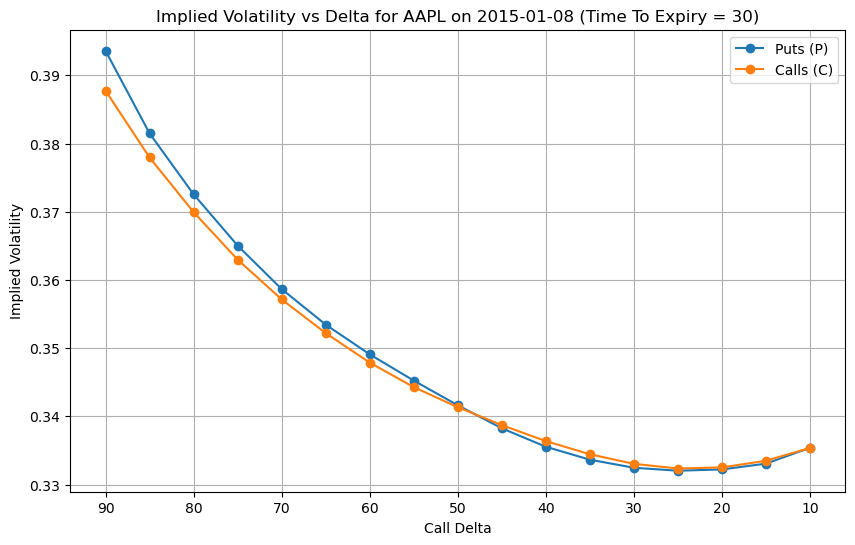

In [7]:

date = '2015-01-08'
days_filter = 30
ticker = 'AAPL'
appl_single_day = options_iv_df.loc[(options_iv_df.ticker == ticker) & (options_iv_df.date == date)].dropna()

# Filter data for puts and calls based on 'days'
puts = appl_single_day[(appl_single_day['cp_flag'] == 'P') & (appl_single_day['days'] == days_filter)].copy()
calls = appl_single_day[(appl_single_day['cp_flag'] == 'C') & (appl_single_day['days'] == days_filter)]

# Adjust delta for puts
# puts['delta'] = puts['delta'] + 100

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(puts['delta'], puts['impl_volatility'], label='Puts (P)', marker='o')
plt.plot(calls['delta'], calls['impl_volatility'], label='Calls (C)', marker='o')

plt.xlabel('Call Delta')
plt.ylabel('Implied Volatility')
plt.title(f'Implied Volatility vs Delta for AAPL on {date} (Time To Expiry = {days_filter})')
plt.legend()
plt.grid(True)
plt.gca().invert_xaxis()  # Reverse the x-axis direction
plt.show()

In [8]:

d1_cache = {delta : norm.ppf(delta/100) for delta in range(1, 101)}
time_moneyness_cache = {}

def calculate_vega(row):
    days = row['days']
    delta = row['delta']
    fwd = row['fwd']
    d1 = d1_cache[delta] if delta in d1_cache else norm.ppf(delta/100)
    if (d1,days) not in time_moneyness_cache:
        time_moneyness_cache[(d1,days)] = norm.pdf(d1)*np.sqrt(days/365)
    time_moneyness = time_moneyness_cache[(d1,days)]
    vega = fwd*time_moneyness
    return vega

def precompute_forward_prices(forwards_df, unique_days):
    """
    Precomputes interpolated forward prices for each (date, ticker) combination
    based on the given unique days in the options data.

    Parameters:
        forwards_df (pd.DataFrame): DataFrame containing forward prices with columns ['date', 'ForwardPrice', 'ticker', 'days']
        unique_days (np.array): Unique days to maturity from the options data.

    Returns:
        dict: A dictionary where keys are (date, ticker) pairs, and values are dictionaries mapping days to interpolated prices.
    """
    precomputed_values = {}

    for (date, ticker), group in forwards_df.groupby(['date', 'ticker']):
        group = group.sort_values(by="days")
        if len(group) > 1:
            interp_prices = np.interp(unique_days, group["days"], group["ForwardPrice"])
        else:
            interp_prices = np.full_like(unique_days, group["ForwardPrice"].values[0], dtype=np.float64)

        precomputed_values[(date, ticker)] = dict(zip(unique_days, interp_prices))

    return precomputed_values

def assign_forward_prices(options_iv_df, precomputed_values):
    """
    Assigns interpolated forward prices to the options data based on the precomputed values.

    Parameters:
        options_iv_df (pd.DataFrame): DataFrame containing options implied volatility data.
        precomputed_values (dict): Dictionary of precomputed forward prices.

    Returns:
        pd.DataFrame: options_iv_df with a new column 'ForwardPrice'.
    """
    options_iv_df["fwd"] = options_iv_df.progress_apply(
        lambda row: precomputed_values.get((row["date"], row["ticker"]), {}).get(row["days"], np.nan), axis=1
    )
    return options_iv_df

def plot_heatmap(index_mapped_data, title, is_int=False, show_values=True, scale=None, save=None):
  unstacked_data = index_mapped_data.unstack()
  max_abs_value = np.abs(unstacked_data.values).max()
  if scale is None:
    scale = (-max_abs_value, max_abs_value)
  plt.figure(figsize=(12, 8))
  sns.heatmap(unstacked_data, cmap='coolwarm', annot=show_values, fmt="d" if is_int else '.2f', vmin=scale[0], vmax=scale[1])
  plt.title(title)
  plt.xlabel('Delta')
  plt.ylabel('Days')
  plt.gca().invert_yaxis()  # Reverse the y-axis direction
  plt.gca().invert_xaxis()  # Reverse the x-axis direction
  if save:
    plt.savefig(save, format='png')
  plt.show()

# Get unique days from options_iv_df
unique_days = np.array(options_iv_df['days'].unique())

# Step 1: Precompute interpolated forward prices
precomputed_values = precompute_forward_prices(forwards_df, unique_days)

# Step 2: Assign interpolated forward prices to options_iv_df
options_iv_df = assign_forward_prices(options_iv_df, precomputed_values)



100%|██████████| 6085728/6085728 [01:06<00:00, 91760.63it/s] 


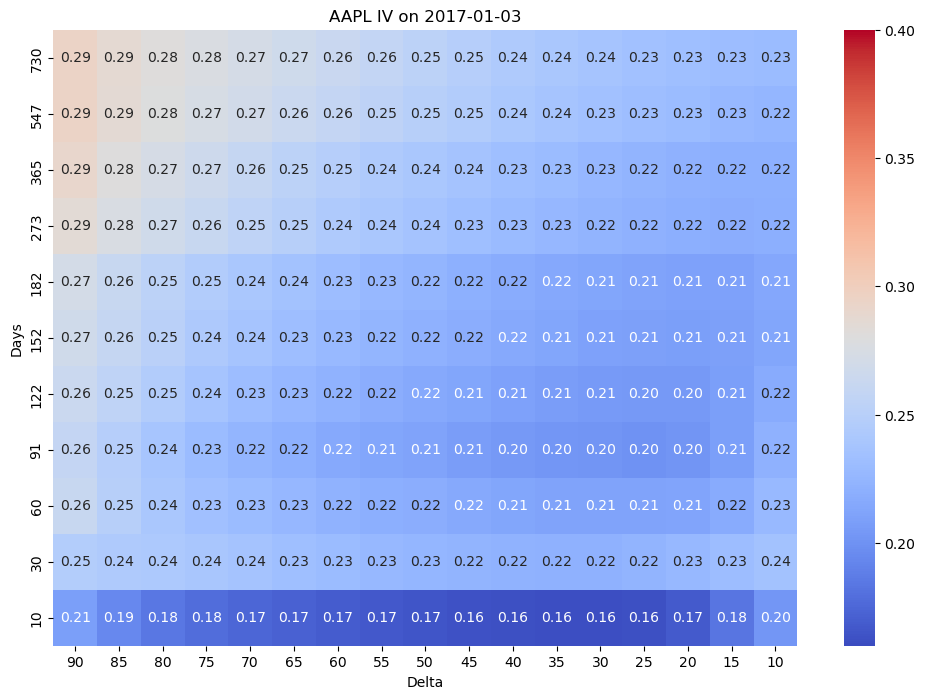

In [19]:
date = "2017-01-03"
scale = (.16, .4)
sample_surface = options_iv_df[(options_iv_df.ticker=='AAPL') & (options_iv_df.date == date)].groupby(['delta', 'days'])['impl_volatility'].mean().unstack().unstack()
plot_heatmap(sample_surface, f"AAPL IV on {date}", scale=scale, save=f'./pics/aapl_surface.png')

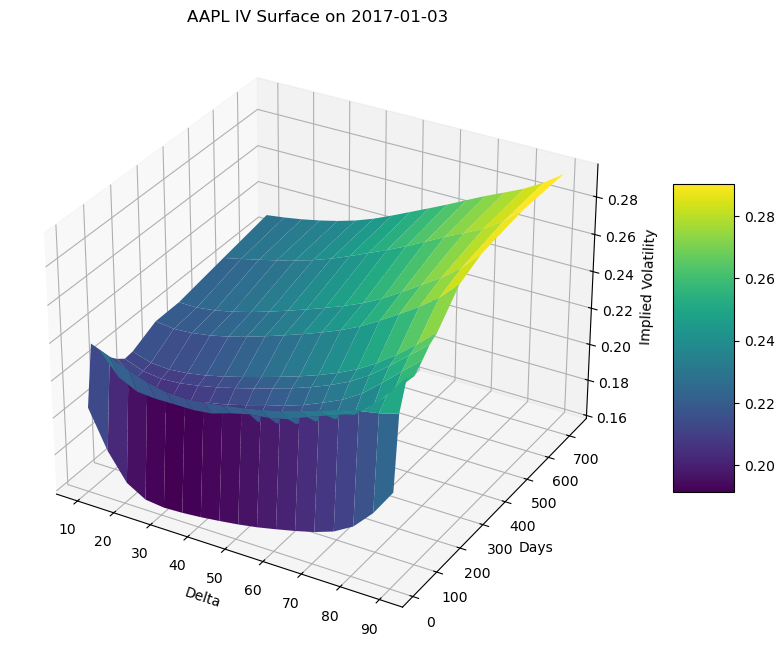

In [20]:


# Unstack the sample_surface to get a DataFrame
sample_surface_df = sample_surface.unstack()

# Create meshgrid for plotting
X, Y = np.meshgrid(sample_surface_df.columns, sample_surface_df.index)
Z = sample_surface_df.values

# Plotting
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

# Add color bar which maps values to colors
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# Labels and title
ax.set_xlabel('Delta')
ax.set_ylabel('Days')
ax.set_zlabel('Implied Volatility')
ax.set_title(f'AAPL IV Surface on {date}')
plt.savefig(f'./pics/aapl_3d_iv_surface_{date}.png', format='png')
plt.show()

$\Phi(x,y,z) = \frac{1}{\sqrt{2\pi}} \exp \left( -\left[ \frac{x^2}{2h} + \frac{y^2}{2h} + \frac{z^2}{2h} \right] \right)$


In [21]:
# Filter options_iv_df to only include rows where ticker is AAPL
aapl_iv_df = options_iv_df[options_iv_df['ticker'] == 'AAPL'].copy()

# Drop rows where days == 10
aapl_iv_df = aapl_iv_df[aapl_iv_df['days'] != 10]
aapl_iv_df['vega'] = aapl_iv_df.progress_apply(calculate_vega, axis=1)
aapl_iv_df['dollar_vol'] = aapl_iv_df['vega'] * aapl_iv_df['impl_volatility']

aapl_log_fwd = np.log(aapl_iv_df.groupby(['date'])['fwd'].min())

# Group by date and delta, then calculate the average implied volatility
aapl_iv_grouped = aapl_iv_df.groupby(['date', 'delta', 'days'])['impl_volatility'].mean().unstack().unstack()

# Flatten the DataFrame such that there's a unique column for every delta value
aapl_iv_diff = aapl_iv_grouped.diff().dropna().reset_index()

# Display the resulting DataFrame
aapl_iv_diff.set_index(aapl_iv_diff.columns[0], inplace=True)

aapl_vega_flattened = aapl_iv_df.groupby(['date', 'delta', 'days'])['vega'].mean().unstack().unstack()
aapl_vega_flattened.mean()

100%|██████████| 691560/691560 [00:06<00:00, 100483.50it/s]


days  delta
30    10        8.336681
      15       11.075720
      20       13.299005
      25       15.095311
      30       16.516410
                 ...    
730   70       82.119059
      75       75.053401
      80       66.122226
      85       55.068122
      90       41.449710
Length: 170, dtype: float64

In [22]:
aapl_vega_flattened

days             30                                                         \
delta             10        15         20         25         30         35   
date                                                                         
2015-01-02  5.493578  7.298508   8.763575   9.947277  10.883731  11.594503   
2015-01-05  5.329760  7.080866   8.502245   9.650649  10.559178  11.248755   
2015-01-06  5.325487  7.075189   8.495428   9.642911  10.550712  11.239736   
2015-01-07  5.397034  7.170244   8.609564   9.772464  10.692461  11.390742   
2015-01-08  5.604039  7.445261   8.939786  10.147289  11.102573  11.827636   
...              ...       ...        ...        ...        ...        ...   
2023-01-25  7.148916  9.497711  11.404235  12.944612  14.163241  15.088185   
2023-01-26  7.255315  9.639068  11.573967  13.137270  14.374036  15.312746   
2023-01-27  7.355590  9.772289  11.733930  13.318840  14.572699  15.524383   
2023-01-30  7.205093  9.572345  11.493850  13.046333  14.274537  15.206749   
2023-01-31  7.271272  9.660267  11.599422  13.166164  14.405650  15.346424   

days                                                    ...        730  \
delta              40         45         50         55  ...         45   
date                                                    ...              
2015-01-02  12.093580  12.389777  12.487986  12.389777  ...  60.246002   
2015-01-05  11.732948  12.020313  12.115594  12.020313  ...  58.479477   
2015-01-06  11.723542  12.010676  12.105880  12.010676  ...  58.443832   
2015-01-07  11.881047  12.172039  12.268522  12.172039  ...  59.274244   
2015-01-08  12.336748  12.638901  12.739085  12.638901  ...  61.622964   
...               ...        ...        ...        ...  ...        ...   
2023-01-25  15.737643  16.123092  16.250893  16.123092  ...  86.053927   
2023-01-26  15.971871  16.363056  16.492760  16.363056  ...  87.456274   
2023-01-27  16.192617  16.589209  16.720705  16.589209  ...  88.633790   
2023-01-30  15.861311  16.249788  16.378595  16.249788  ...  86.874782   
2023-01-31  16.006998  16.399044  16.529033  16.399044  ...  87.548964   

days                                                                          \
delta              50         55         60         65         70         75   
date                                                                           
2015-01-02  60.723551  60.246002  58.805726  56.378939  52.922769  48.369207   
2015-01-05  58.943022  58.479477  57.081432  54.725803  51.370974  46.950931   
2015-01-06  58.907095  58.443832  57.046639  54.692447  51.339662  46.922314   
2015-01-07  59.744090  59.274244  57.857199  55.469556  52.069133  47.589020   
2015-01-08  62.111427  61.622964  60.149769  57.667517  54.132353  49.474717   
...               ...        ...        ...        ...        ...        ...   
2023-01-25  86.736045  86.053927  83.996671  80.530308  75.593598  69.089401   
2023-01-26  88.149508  87.456274  85.365492  81.842641  76.825482  70.215292   
2023-01-27  89.336358  88.633790  86.514858  82.944575  77.859864  71.160674   
2023-01-30  87.563407  86.874782  84.797902  81.298474  76.314673  69.748434   
2023-01-31  88.242933  87.548964  85.455967  81.929382  76.906905  70.289709   

days                                         
delta              80         85         90  
date                                         
2015-01-02  42.613387  35.489416  26.712841  
2015-01-05  41.363883  34.448800  25.929571  
2015-01-06  41.338671  34.427803  25.913766  
2015-01-07  41.926040  34.916978  26.281968  
2015-01-08  43.587344  36.300550  27.323381  
...               ...        ...        ...  
2023-01-25  60.867927  50.692220  38.155974  
2023-01-26  61.859840  51.518308  38.777769  
2023-01-27  62.692724  52.211953  39.299875  
2023-01-30  61.448537  51.175766  38.519938  
2023-01-31  61.925402  51.572910  38.818868  

[2034 rows x 170 columns]

In [23]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import Ridge  # or any other regressor
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
import numpy as np
from ipca import InstrumentedPCA as IPCA

class IPCAModel(BaseEstimator, RegressorMixin):
    def __init__(self, n_factors=5, intercept=True, max_iter=1000, iter_tol=.0001, alpha=0.05, N=None, L=None):
        self.n_factors = n_factors
        self.intercept = intercept
        self.max_iter = max_iter
        self.iter_tol = iter_tol
        self.alpha = alpha
        self.model = IPCA(n_factors=n_factors, intercept=intercept, max_iter=max_iter, iter_tol=iter_tol,  alpha=alpha, n_jobs=-1)
        self.N = N
        self.L = L
        self.fitted_ = False

    def fit(self, X, Y):
        if isinstance(Y, (pd.DataFrame)) and len(Y)==1:
            Y = Y.iloc[0]
        elif isinstance(Y, (pd.DataFrame)) and Y.shape[1] == 1:
            Y = Y.iloc[:, 0]
        elif not isinstance(Y, pd.Series):
            raise ValueError("Y must be a Series or DataFrame with a single column.")
        self.model.fit(X, Y)
        return self

    def predict(self, X):
        ys=[]
        pred_ys=[]
        for i in X.index.get_level_values(1).unique():
            X_slice = X.xs(i, level=1, drop_level=False)
            y_slice = X_slice.iloc[:, 0] # doesn't matter when using the mean factor

            y_pred = self.model.predictOOS(X_slice, y_slice, mean_factor=True)

            ys.append(y_slice)
            # Convert y_pred (numpy array) to DataFrame with the same index as y_slice
            pred_ys.append(pd.DataFrame(y_pred, index=y_slice.index, columns=[y_slice.name]))

        ys = pd.concat(ys)
        pred_ys = pd.concat(pred_ys)
        return pred_ys


from sklearn.base import TransformerMixin
class OptionalVolDiffPCA(PCA, TransformerMixin):
  def __init__(self, n_cols=None, n_components=None, **kwargs):
    super().__init__(n_components=n_components, **kwargs)
    self.n_cols = n_cols

  def fit(self, X, y=None):
    if self.n_components == 0:
      self.n_features_in_ = X.shape[1]
      return self
    if self.n_cols:
      X = X[:, :self.n_cols] if isinstance(X, np.ndarray) else X.iloc[:, :self.n_cols]
    return super().fit(X, y)

  def transform(self, X):
    if self.n_components == 0:
      return X
    if self.n_cols:
      X = X[:, :self.n_cols] if isinstance(X, np.ndarray) else X.iloc[:, :self.n_cols]
    return super().transform(X)

  def fit_transform(self, X, y=None):
    if self.n_components == 0:
      self.n_features_in_ = X.shape[1]
      return X
    if self.n_cols:
      X = X[:, :self.n_cols] if isinstance(X, np.ndarray) else X.iloc[:, :self.n_cols]
    return super().fit_transform(X, y)

def oos_vega_weighted_mse(y_true, y_pred, weights):
    return mean_squared_error(y_true, y_pred, multioutput=weights)

In [24]:
##########################################################################################
#
# TODO:
# 1. Turn this data-preprocessing step into a function that's separate from
#    the covariates that we choose to include in the model.
# 2. Create a pipeline mixin regressor that can be used to fit and predict
#    with hyper parameter tuning.
# 3. Bring in another equities dataset (e.g. SPY) and run the same analysis concurrently.
#    Would also be good to bring in VIX data or something similar as a covariate.
# 4. Run a TimeSeries Grid Search over parameters (n_factors, normalization, etc)
# 5. Plot the factor loadings (each factor should load back onto several
#    characteristics) and plot the factors (each factor should vary over time).
# 6. Build a simple sharpe-ratio model.  If Y is the implied_volatility_diff,
#    we'll want to calculate profit as:
#     expected iv diff (y_pred, let this be our hypothetical qty) *
#     actual iv diff *
#     vega
#    This will give us a simple revenue model.
#    We can also build a simple cost calculation here as well.
# 7. Graphs that might be useful for the presentation:
#    - Factor loadings over for the optimal IPCA factors
#    - Factors over time
#    - Residual heatmap (show the delta X days grid, with the avg residual as the color)
#    - P&L / Sharpe ratio over time
#    - Different factor loadings for different equities (SPY vs AAPL vs GLD)
#
############################################################################################

def get_ipca_inputs():
  #Data preprocessing; it takes our AAPL iv Dataframe and gets into the right shape for the IPCA algo;
  Y = (aapl_iv_diff).iloc[1:]
  Y = Y.stack(level=[0,1],future_stack=True)

  X = pd.concat([
    aapl_iv_diff.shift(1).stack(level=[0,1],future_stack=True).rename('X_impl_volatility_diff'),
    aapl_iv_grouped.shift(1).stack(level=[0,1],future_stack=True).rename('X_impl_volatility_level'),
    aapl_vega_flattened.shift(1).stack(level=[0,1],future_stack=True).rename('X_vega'),
    ], axis=1)
  X = X.join(aapl_log_fwd.shift(1), how='left', on=X.index.get_level_values(0)).drop(columns=['key_0'])
  X = X.join(aapl_log_fwd.diff(), how='left', on=X.index.get_level_values(0), rsuffix='_diff').drop(columns=['key_0']).dropna()
  # Add 'delta' and 'days' as covariates to the X DataFrame
  X['days'] = X.index.get_level_values(1).astype(int)
  X['delta'] = X.index.get_level_values(2).astype(int)


  # Merge levels 2 and 3 of the MultiIndex into a single tuple for level 2 indexing
  X.index = pd.MultiIndex.from_tuples(
    [(idx[0], (idx[1], idx[2])) for idx in X.index],
    names=['delta_days', 'date']
  )

  Y.index = pd.MultiIndex.from_tuples(
    [(idx[0], (idx[1], idx[2])) for idx in Y.index],
    names=['delta_days', 'date']
  )
  return X, Y

X, Y = get_ipca_inputs()

# Create dictionaries for encoding and decoding the first and second levels of the MultiIndex
date_to_int = {date: i for i, date in enumerate(X.index.get_level_values(0).unique())}
int_to_date = {i: date for date, i in date_to_int.items()}

delta_days_to_int = {delta_days: i for i, delta_days in enumerate(X.index.get_level_values(1).unique())}
int_to_delta_days = {i: delta_days for delta_days, i in delta_days_to_int.items()}

# Function to encode the MultiIndex of a DataFrame
def encode_index(df):
  df = df.copy()
  df.index = pd.MultiIndex.from_tuples(
    [(delta_days_to_int[idx[1]], date_to_int[idx[0]]) for idx in df.index],
    names=['delta_days', 'date']
  )
  return df

# Function to decode the MultiIndex of a DataFrame
def decode_index(df):
  df = df.copy()
  df.index = pd.MultiIndex.from_tuples(
    [(int_to_delta_days[idx[0]], int_to_date[idx[1]]) for idx in df.index],
    names=['delta_days', 'date']
  )
  return df

In [25]:
X

X_impl_volatility_diff  X_impl_volatility_level  \
delta_days date                                                         
2015-01-06 (30, 10)                 0.024708                 0.359773   
           (30, 15)                 0.025742                 0.356821   
           (30, 20)                 0.026786                 0.354159   
           (30, 25)                 0.027768                 0.352845   
           (30, 30)                 0.028670                 0.353248   
...                                      ...                      ...   
2023-01-31 (730, 70)                0.004252                 0.295883   
           (730, 75)                0.004544                 0.305786   
           (730, 80)                0.004525                 0.318114   
           (730, 85)                0.004238                 0.332852   
           (730, 90)                0.003789                 0.348742   

                         X_vega       fwd  fwd_diff  days  delta  
delta_days date                                                   
2015-01-06 (30, 10)    5.329760  4.648936 -0.000610    30     10  
           (30, 15)    7.080866  4.648936 -0.000610    30     15  
           (30, 20)    8.502245  4.648936 -0.000610    30     20  
           (30, 25)    9.650649  4.648936 -0.000610    30     25  
           (30, 30)   10.559178  4.648936 -0.000610    30     30  
...                         ...       ...       ...   ...    ...  
2023-01-31 (730, 70)  76.314673  4.964264  0.009143   730     70  
           (730, 75)  69.748434  4.964264  0.009143   730     75  
           (730, 80)  61.448537  4.964264  0.009143   730     80  
           (730, 85)  51.175766  4.964264  0.009143   730     85  
           (730, 90)  38.519938  4.964264  0.009143   730     90  

[345440 rows x 7 columns]

In [43]:

#Here's the simple IPCA working model, you'll need to install ipca from pip
# pip install ipca
from sklearn.metrics import r2_score, root_mean_squared_error

X, Y = get_ipca_inputs()
X = encode_index(X)
Y = encode_index(Y)
X = X.sort_index(level=1)
Y = Y.sort_index(level=1)

# 80-20 train-test split (time series aware: no shuffling)
split_idx = int(0.80 * len(X))
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
Y_train, Y_test = Y.iloc[:split_idx], Y.iloc[split_idx:]

scaler_X = StandardScaler(with_std=False, with_mean=False)
scaler_Y = StandardScaler(with_std=False, with_mean=False)

# Ensure Y_train_scaled is always a DataFrame, even if it's a single column
if isinstance(Y_train, pd.Series):
	Y_train = Y_train.to_frame()
if isinstance(Y_test, pd.Series):
	Y_test = Y_test.to_frame()

X_train_scaled = pd.DataFrame(scaler_X.fit_transform(X_train), index=X_train.index, columns=X_train.columns)
Y_train_scaled = pd.DataFrame(scaler_Y.fit_transform(Y_train), index=Y_train.index, columns=Y_train.columns)
X_test_scaled = pd.DataFrame(scaler_X.transform(X_test), index=X_test.index, columns=X_test.columns)
Y_test_scaled = pd.DataFrame(scaler_Y.transform(Y_test), index=Y_test.index, columns=Y_test.columns)
X_scaled = pd.DataFrame(scaler_X.transform(X), index=X.index, columns=X.columns)
Y_scaled = pd.DataFrame(scaler_Y.transform(Y.to_frame()), index=Y.index)

 
models = []
for factors in [1,2,3]:
	ipca = IPCAModel(n_factors=factors, intercept=True, max_iter=1000, iter_tol=.0001, alpha=0.00)
	ipca.fit(X=X_train_scaled, Y=Y_train_scaled)
	y_is_pred = pd.DataFrame(scaler_Y.inverse_transform(ipca.model.predict(X_train_scaled, Y_train_scaled[0]).reshape(-1,1)), index=Y_train_scaled.index)
	y_oos_pred = pd.DataFrame(scaler_Y.inverse_transform(ipca.predict(X_test_scaled)), index=Y_test_scaled.index)
	Gamma, Factors = ipca.model.get_factors()
	models.append((ipca, y_oos_pred, y_is_pred))

The panel dimensions are:
n_samples: 170 , L: 7 , T: 1626


[========================================================================] 100%


Step 1 - Aggregate Update: 0.9308642151030996
Step 2 - Aggregate Update: 0.043635363200439425
Step 3 - Aggregate Update: 0.0274225891923936
Step 4 - Aggregate Update: 0.021152082429260366
Step 5 - Aggregate Update: 0.019750843762807113
Step 6 - Aggregate Update: 0.021613060853769905
Step 7 - Aggregate Update: 0.025081990131105236
Step 8 - Aggregate Update: 0.029888082844604646
Step 9 - Aggregate Update: 0.035287870757586104
Step 10 - Aggregate Update: 0.0431029471323916
Step 11 - Aggregate Update: 0.04650582706812767
Step 12 - Aggregate Update: 1.6201774387319463
Step 13 - Aggregate Update: 0.0343571081516969
Step 14 - Aggregate Update: 0.04200986331379708
Step 15 - Aggregate Update: 0.05797810201064618
Step 16 - Aggregate Update: 0.033082100087717725
Step 17 - Aggregate Update: 0.024866393928008546
Step 18 - Aggregate Update: 0.020364480348822434
Step 19 - Aggregate Update: 0.017537525082558292
Step 20 - Aggregate Update: 0.0157924033952197
Step 21 - Aggregate Update: 0.01499143325413

The panel dimensions are:
n_samples: 170 , L: 7 , T: 1626


[========================================================================] 100%


Step 1 - Aggregate Update: 0.9308915642196378
Step 2 - Aggregate Update: 0.20977145370364098
Step 3 - Aggregate Update: 0.05123571393666526
Step 4 - Aggregate Update: 0.01145449831903933
Step 5 - Aggregate Update: 0.03111730254984424
Step 6 - Aggregate Update: 0.035840307664347315
Step 7 - Aggregate Update: 0.0026871874420797415
Step 8 - Aggregate Update: 0.038735132579195475
Step 9 - Aggregate Update: 1.4675560263783756
Step 10 - Aggregate Update: 0.22036950594051996
Step 11 - Aggregate Update: 0.1944550337490758
Step 12 - Aggregate Update: 0.10198276595904204
Step 13 - Aggregate Update: 0.05019036436695018
Step 14 - Aggregate Update: 0.02659801091549839
Step 15 - Aggregate Update: 0.015569733504519331
Step 16 - Aggregate Update: 0.010513709795964547
Step 17 - Aggregate Update: 0.008723499193156112
Step 18 - Aggregate Update: 0.00922453009117341
Step 19 - Aggregate Update: 0.010561175589492523
Step 20 - Aggregate Update: 0.008721887591570613
Step 21 - Aggregate Update: 0.0054904067379

The panel dimensions are:
n_samples: 170 , L: 7 , T: 1626


[========================================================================] 100%


Step 1 - Aggregate Update: 0.9963080039376165
Step 2 - Aggregate Update: 0.5750679065363431
Step 3 - Aggregate Update: 0.22884093156471913
Step 4 - Aggregate Update: 0.091847617590546
Step 5 - Aggregate Update: 0.019924145195178822
Step 6 - Aggregate Update: 0.011306585139738229
Step 7 - Aggregate Update: 0.012349159057736148
Step 8 - Aggregate Update: 0.015718209572894187
Step 9 - Aggregate Update: 0.01824283332036236
Step 10 - Aggregate Update: 0.020699425263348753
Step 11 - Aggregate Update: 0.023574077742641697
Step 12 - Aggregate Update: 0.02723594392816181
Step 13 - Aggregate Update: 0.03203553777141416
Step 14 - Aggregate Update: 0.03835055457752801
Step 15 - Aggregate Update: 0.046552779691713564
Step 16 - Aggregate Update: 0.05681093226140577
Step 17 - Aggregate Update: 0.06858282800180732
Step 18 - Aggregate Update: 1.6996476816218746
Step 19 - Aggregate Update: 0.08612590762891936
Step 20 - Aggregate Update: 0.0833453317936731
Step 21 - Aggregate Update: 0.08516675650310668


In [98]:
for ipca, y_oos_pred, y_is_pred in models:
  print(f"Factors: {ipca.n_factors} + Constant")
  ipca_is_r2 = r2_score(Y_train_scaled, y_is_pred)
  ipca_is_rmse = root_mean_squared_error(Y_train_scaled, y_is_pred)
  print(f"IPCA In-Sample R^2: {ipca_is_r2:.4f}")
  print(f"IPCA In-Sample RMSE: {ipca_is_rmse:.4f}")

  ipca_oos_rmse = root_mean_squared_error(Y_test_scaled, y_oos_pred)
  ipca_oos_r2 = r2_score(Y_test_scaled, y_oos_pred)
  print(f"IPCA OOS R^2: {ipca_oos_r2:.4f}")
  print(f"IPCA OOS RMSE: {ipca_oos_rmse:.4f}\n")

Factors: 1 + Constant
IPCA In-Sample R^2: 0.6492
IPCA In-Sample RMSE: 0.0089
IPCA OOS R^2: 0.2939
IPCA OOS RMSE: 0.0119

Factors: 2 + Constant
IPCA In-Sample R^2: 0.7910
IPCA In-Sample RMSE: 0.0069
IPCA OOS R^2: -0.1199
IPCA OOS RMSE: 0.0150

Factors: 3 + Constant
IPCA In-Sample R^2: 0.8830
IPCA In-Sample RMSE: 0.0052
IPCA OOS R^2: -0.1474
IPCA OOS RMSE: 0.0152



IPCA OOS R^2: 0.2939
IPCA OOS RMSE: 0.0119


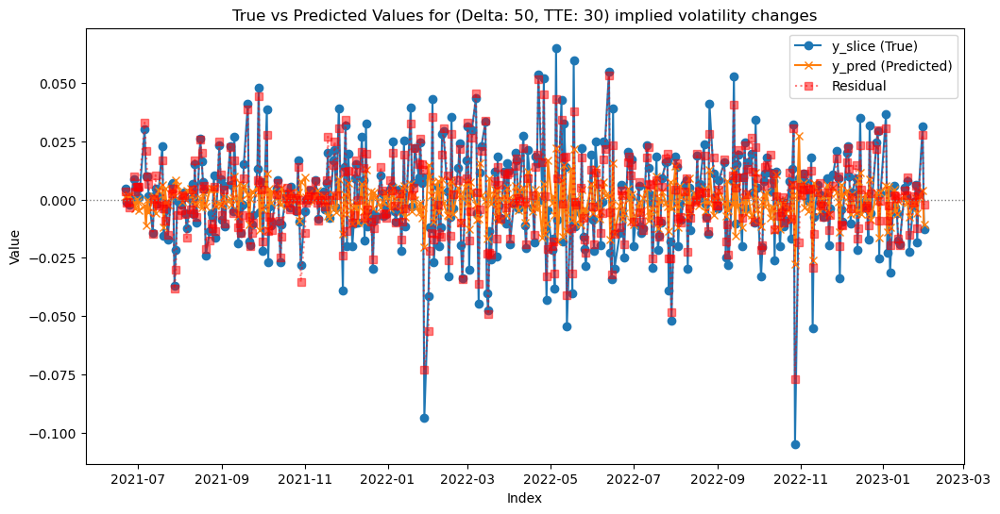

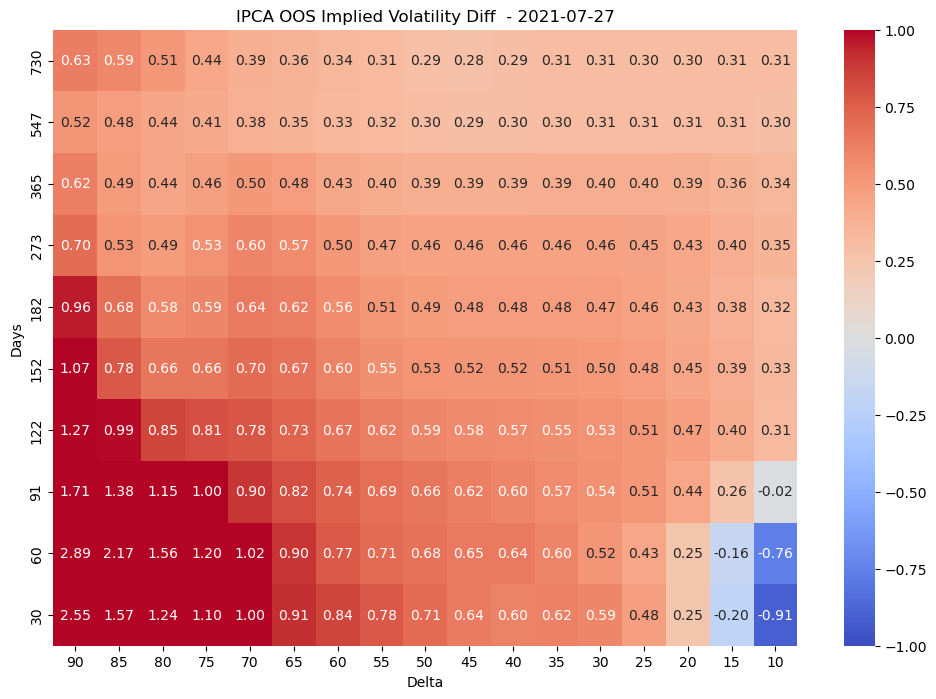

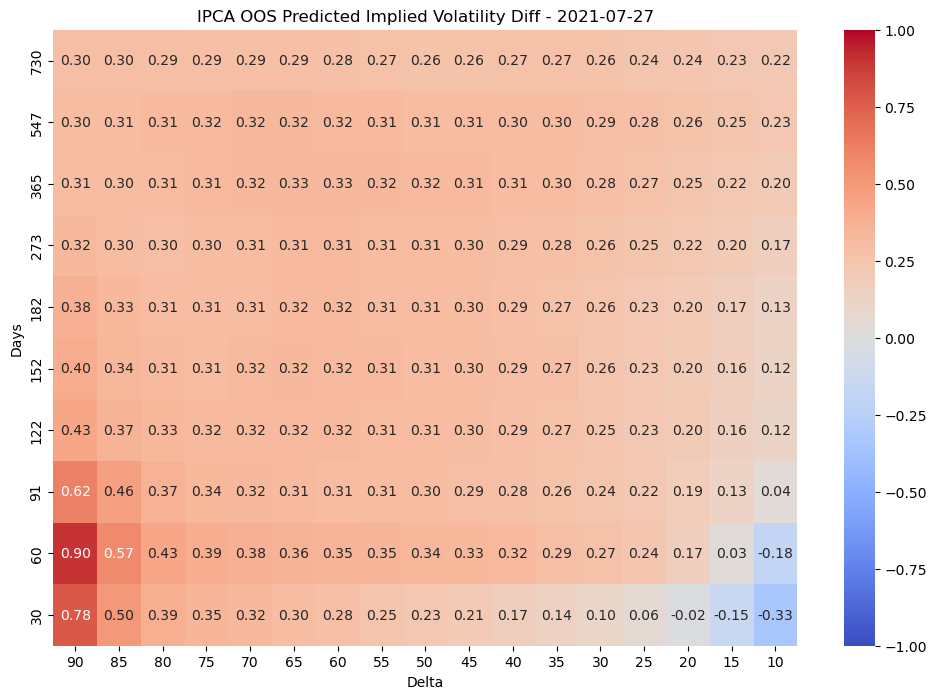

In [52]:
best_ipca = models[0][0]

def testIPCAModel(X_test, Y_test, ipca_model):
  ys = Y_test
  pred_ys = pd.DataFrame(scaler_Y.inverse_transform(ipca_model.predict(X_test)), index=ys.index, columns=ys.columns)
  ipca_oos_rmse = root_mean_squared_error(ys, pred_ys)
  ipca_oos_r2 = r2_score(ys, pred_ys)
  return ys, pred_ys, ipca_oos_rmse, ipca_oos_r2

def pull_point_series(ys, d, t):
  return decode_index(ys).xs(((t,d)), level=0)

def extract_surface_row(df, row_idx=1):
  decoded = decode_index(df)
  decoded.index = pd.MultiIndex.from_tuples(decoded.index, names=['date', 'days_delta'])
  unstacked = decoded.unstack(level=0)
  row = unstacked.iloc[row_idx].droplevel(0)
  row.index = pd.MultiIndex.from_tuples(row.index, names=['days', 'delta'])
  return row


ys, pred_ys, ipca_oos_rmse, ipca_oos_r2 = testIPCAModel(X_test_scaled, Y_test_scaled, best_ipca)
print(f"IPCA OOS R^2: {ipca_oos_r2:.4f}")
print(f"IPCA OOS RMSE: {ipca_oos_rmse:.4f}")

# Plot the true vs predicted values for a specific delta and tte timeseries
delta = 50
tte = 30
true_y_point = pull_point_series(ys, delta, tte)
pred_y_point = pull_point_series(pred_ys, delta, tte)
residual = true_y_point - pred_y_point
plt.figure(figsize=(12, 6))
plt.plot(true_y_point, label='y_slice (True)', marker='o')
plt.plot(pred_y_point, label='y_pred (Predicted)', marker='x')
plt.plot(residual, label='Residual', marker='s', color='red', linestyle='dotted', alpha=0.5)
plt.axhline(0, color='grey', linestyle='dotted', linewidth=1)
plt.xlabel('Index')
plt.ylabel('Value')
plt.title(f'True vs Predicted Values for (Delta: {delta}, TTE: {tte}) implied volatility changes')
plt.legend()
plt.savefig(f'./pics/ipca_oos_pred_{delta}_{tte}.png', format='png')
plt.show()

# Plot the Heatmap for the true and predicted values
idx = 25
y_row = extract_surface_row(ys, row_idx=idx)
y_row_pred = extract_surface_row(pred_ys, row_idx=idx)
plot_heatmap(y_row*100, f"IPCA OOS Implied Volatility Diff  - {y_row.name.strftime('%Y-%m-%d')}", scale=(-1,1), save=f'./pics/ipca_oos_true_{y_row.name.strftime("%Y-%m-%d")}.png')
plot_heatmap(y_row_pred*100, f"IPCA OOS Predicted Implied Volatility Diff - {y_row.name.strftime('%Y-%m-%d')}", scale=(-1,1), save=f'./pics/ipca_oos_pred_{y_row.name.strftime("%Y-%m-%d")}.png')

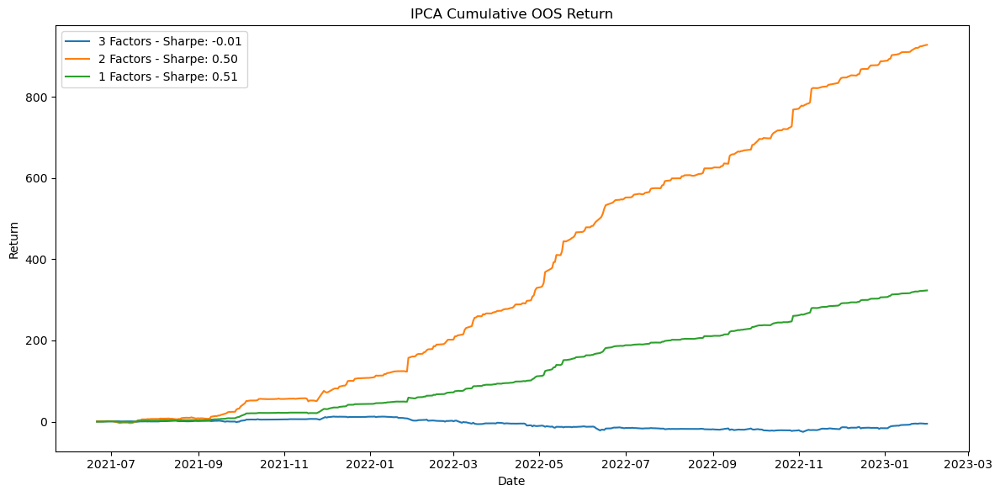

0    0.514192
dtype: float64


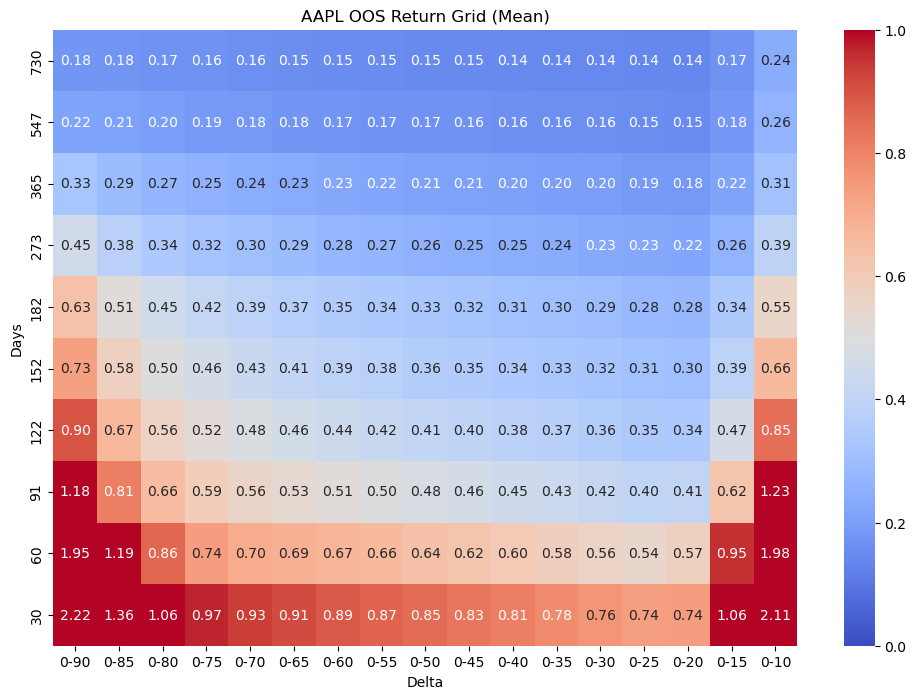

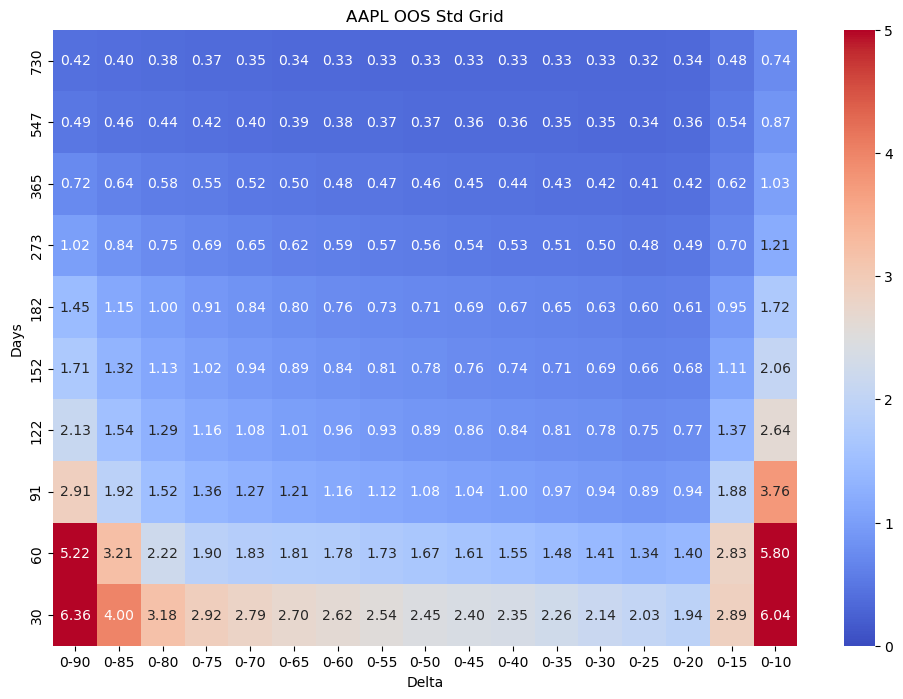

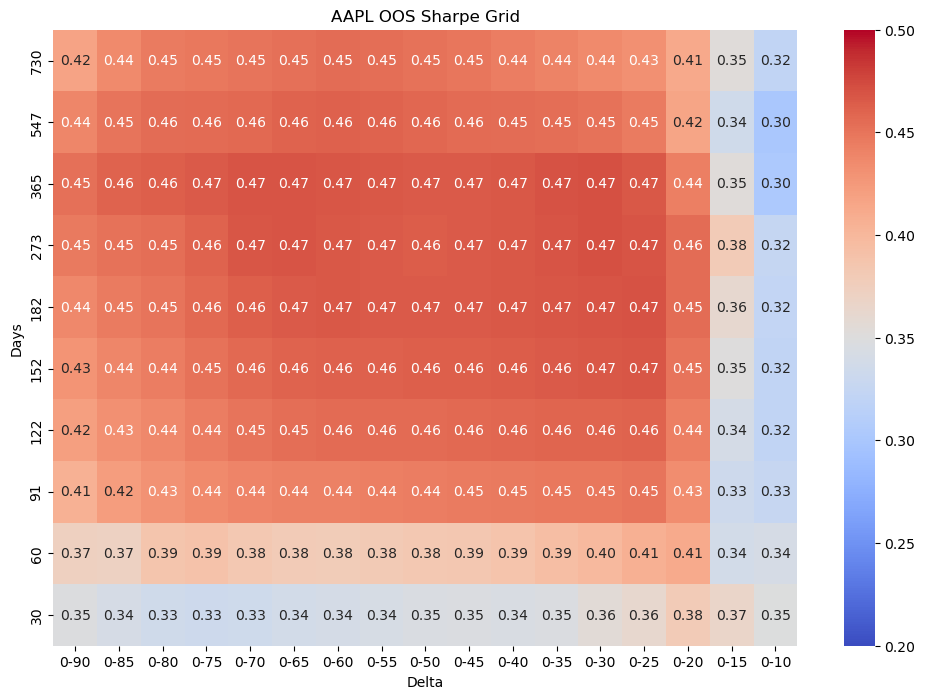

In [99]:
def generate_strategy_returns(ys, pred_ys):
  return_raw = ys * pred_ys * 100
  return_raw = decode_index(return_raw)
  new_index = pd.MultiIndex.from_tuples(
    [(idx[1], idx[0][0], idx[0][1]) for idx in return_raw.index],
    names=['date', 'days', 'delta']
  )
  return_raw.index = new_index
  return return_raw

fig, ax = plt.subplots(figsize=(12, 6))
for model, pred, is_pred in models[::-1]:
  return_raw = generate_strategy_returns(ys, pred)
  return_timeseries = return_raw.groupby(level=0).sum()
  sharpe = return_timeseries.mean() / return_timeseries.std()
  sharpe_val = sharpe.iloc[0] if isinstance(sharpe, pd.Series) else sharpe
  ax.plot(return_timeseries.cumsum(), label=f"{model.n_factors} Factors - Sharpe: {sharpe_val:.2f}")

ax.set_title("IPCA Cumulative OOS Return")
ax.set_xlabel("Date")
ax.set_ylabel("Return")
ax.legend()
plt.tight_layout()
plt.savefig('./pics/ipca_cumulative_oos_return.png', format='png')
plt.show()

print(return_timeseries.mean() / return_timeseries.std())

return_grid = return_raw.groupby(level=[1,2]).mean()
std_grid = return_raw.groupby(level=[1,2]).std()
plot_heatmap(return_grid*100, f"{ticker} OOS Return Grid (Mean)", scale=(0,1), save=f'./pics/ipca_oos_return_grid.png')
plot_heatmap(std_grid*100, f"{ticker} OOS Std Grid", scale=(0,5), save=f'./pics/ipca_oos_std_grid.png')
plot_heatmap(return_grid/std_grid, f"{ticker} OOS Sharpe Grid", scale=(.2,.5), save=f'./pics/ipca_oos_sharpe_grid.png')

In [ ]:
X = pd.concat([aapl_iv_diff, aapl_iv_grouped, aapl_log_fwd], axis=1).shift(1).dropna()
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]

factors_df = pd.DataFrame(Factors.T[1:], index=X_train.index)
plt.figure(figsize=(12, 6))
plt.plot(factors_df)
plt.xlabel('Time')
plt.ylabel('Factor Value')
plt.title('IPCA Factors Over Time')
plt.legend([f'Factor {i+1}' for i in range(factors_df.shape[0])])
plt.grid(True)
plt.show()

In [ ]:
Gamma_df = pd.DataFrame(Gamma.T, columns=X_scaled.columns).iloc[:, :-2]
Gamma_df

# Plot each row of Gamma_df as a bar chart
for idx, row in Gamma_df.iterrows():
  plt.figure(figsize=(12, 4))
  row.plot(kind='bar')
  plt.title(f'Gamma - Factor {idx} Loading')
  plt.xlabel('Feature')
  plt.ylabel('Loading')
  plt.tight_layout()
  plt.show()

In [55]:
# This is a more robust PCA pipeline that gets a small positive R^2 predicting the IV surface
Y = aapl_iv_diff
X = pd.concat([aapl_iv_diff, aapl_iv_grouped, aapl_log_fwd], axis=1).shift(1).dropna()
X.columns = X.columns.map(lambda x: f"X_{x}" if isinstance(x, tuple) else x)
Y = Y.iloc[1:]
X = X

# 80-20 train-test split (time series aware: no shuffling)
split_idx = int(0.8 * len(X))
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
Y_train, Y_test = Y.iloc[:split_idx], Y.iloc[split_idx:]

# Define parameter grid: n_components=0 disables PCA (identity transform)
param_grid = {
    'pca__n_components': [0, 2, 3, 5, 6, 7, 10],  # 0 means no PCA
    'regressor__alpha': np.logspace(0, 5, 20),
}

pipeline = Pipeline([
    ('scaler', StandardScaler(with_mean=True, with_std=False)),
    ('pca', OptionalVolDiffPCA(n_cols=aapl_iv_diff.shape[1])),
    ('regressor', Ridge())
])

scorer = make_scorer(oos_vega_weighted_mse, weights=aapl_vega_flattened.mean().values, greater_is_better=False)

tscv = TimeSeriesSplit(n_splits=5)
gs = GridSearchCV(pipeline, param_grid, cv=tscv, scoring=scorer, refit=True, verbose=1, n_jobs=-1)
gs.fit(X_train, Y_train)
print(f"Best PCA OOS RMSE: {np.sqrt(np.abs(gs.best_score_)):.7f}")
print(f"Best PCA Params: {gs.best_params_}")

# Predict on test set and full set
prediction_train = gs.predict(X_train)
predictions_test = gs.predict(X_test)
predictions_all = gs.predict(X)

# OOS (test set)
is_r2 = r2_score(Y_train, prediction_train)
is_rmse = np.sqrt(mean_squared_error(Y_train, prediction_train))

# OOS (test set)
oos_r2 = r2_score(Y_test, predictions_test)
oos_rmse = np.sqrt(mean_squared_error(Y_test, predictions_test))
# Total (all data)
total_r2 = r2_score(Y, predictions_all)
total_rmse = np.sqrt(mean_squared_error(Y, predictions_all))

print(f"IS R^2: {is_r2:.4f}")
print(f"IS RMSE: {is_rmse:.4f}")

print(f"OOS R^2: {oos_r2:.4f}")
print(f"OOS RMSE: {oos_rmse:.4f}")

print(f"Total R^2: {total_r2:.4f}")
print(f"Total RMSE: {total_rmse:.4f}")

Fitting 5 folds for each of 140 candidates, totalling 700 fits
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require In

In [91]:
res = {}
param_grid = {
    'regressor__alpha': np.logspace(0, 5, 20),
}
for i in range(10):
    param_grid = {
    'regressor__alpha': np.logspace(0, 5, 20),
    'pca__n_components': [i],  # 0 means no PCA
    }
    gs = GridSearchCV(pipeline, param_grid, cv=tscv, scoring=scorer, refit=True, verbose=1, n_jobs=-1)

    gs.fit(X_train, Y_train)
    Y_pred = gs.predict(X_test)
    res[i] = {
        "best_params": gs.best_params_,
        "best_score": gs.best_score_,
        "Y_pred": Y_pred
    }

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

In [92]:
res

{0: {'best_params': {'pca__n_components': 0,
   'regressor__alpha': np.float64(69.51927961775606)},
  'best_score': np.float64(-0.00012383805916786118),
  'Y_pred': array([[ 2.16668600e-03,  1.15929638e-03,  4.46807954e-04, ...,
          -5.34804128e-04, -6.64901429e-04, -8.83553586e-04],
         [-1.61177753e-04,  8.19934939e-04,  1.53051658e-03, ...,
           6.28896357e-05,  1.79605146e-04,  3.84652083e-04],
         [ 8.12623442e-04,  8.61731834e-04,  8.96264427e-04, ...,
          -1.36169547e-04, -1.32769583e-04, -1.29936295e-04],
         ...,
         [ 4.20218339e-04,  2.52705734e-04,  1.36754925e-04, ...,
          -2.27735232e-04, -2.52235772e-04, -2.79542254e-04],
         [ 1.13676598e-03,  7.86116066e-05, -6.84982096e-04, ...,
          -4.43839614e-04, -5.70695452e-04, -7.76387678e-04],
         [-2.19841395e-03, -2.88112775e-03, -3.36788564e-03, ...,
          -4.72792083e-04, -5.51285698e-04, -6.84461709e-04]])},
 1: {'best_params': {'pca__n_components': 1,
   'reg

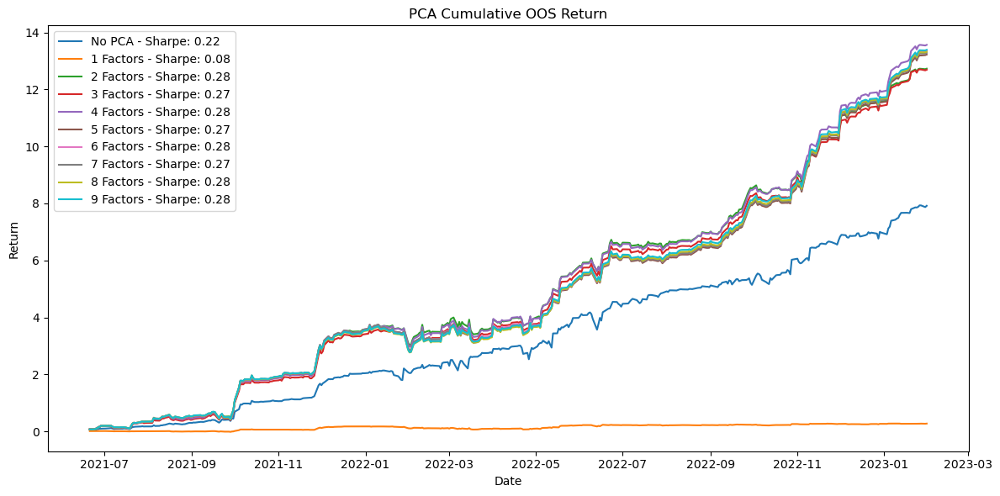

In [96]:
fig, ax = plt.subplots(figsize=(12, 6))
for i, d in res.items():
    predictions_test = pd.DataFrame(d['Y_pred'], index=Y_test.index, columns=Y_test.columns)
    predictions_test = scaler_Y.inverse_transform(predictions_test)
    predictions_test = pd.DataFrame(predictions_test, index=Y_test.index, columns=Y_test.columns)

    # Calculate cumulative returns
    pca_rets = (Y_test * aapl_vega_flattened.mean() * predictions_test).sum(axis=1)
    sharpe = pca_rets.mean() / pca_rets.std()
    sharpe_val = sharpe.iloc[0] if isinstance(sharpe, pd.Series) else sharpe
    label = f"{i} Factors - Sharpe: {sharpe_val:.2f}" if i>0 else f"No PCA - Sharpe: {sharpe_val:.2f}"
    ax.plot(pca_rets.cumsum(), label=label)


ax.set_title("PCA Cumulative OOS Return")
ax.set_xlabel("Date")
ax.set_ylabel("Return")
ax.legend()
plt.tight_layout()
plt.savefig(f'./pics/pca_oos_return.png', format='png')
plt.show()

In [ ]:
# Here's a (currently broken) IPCA pipeline that should do better than the PCA pipeline
# We'll need to bring the work above down here and make sure that the covariates
# and predictions are flowing through correctly
from sklearn import set_config
set_config(transform_output = "pandas")


X, Y = get_ipca_inputs()
X = encode_index(X)
Y = encode_index(Y)
X = X.sort_index(level=1)
Y = Y.sort_index(level=1)

# 80-20 train-test split (time series aware: no shuffling)
split_idx = int(0.8* len(X))
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
Y_train, Y_test = Y.iloc[:split_idx], Y.iloc[split_idx:]

scaler_X = StandardScaler(with_std=True, with_mean=False)
scaler_Y = StandardScaler(with_std=True, with_mean=False)

# Ensure Y_train_scaled is always a DataFrame, even if it's a single column
if isinstance(Y_train, pd.Series):
	Y_train = Y_train.to_frame()
if isinstance(Y_test, pd.Series):
	Y_test = Y_test.to_frame()

X_train_scaled = pd.DataFrame(scaler_X.fit_transform(X_train), index=X_train.index, columns=X_train.columns)
Y_train_scaled = pd.DataFrame(scaler_Y.fit_transform(Y_train), index=Y_train.index, columns=Y_train.columns)
X_test_scaled = pd.DataFrame(scaler_X.transform(X_test), index=X_test.index, columns=X_test.columns)
Y_test_scaled = pd.DataFrame(scaler_Y.transform(Y_test), index=Y_test.index, columns=Y_test.columns)
X_scaled = pd.DataFrame(scaler_X.transform(X), index=X.index, columns=X.columns)
Y_scaled = pd.DataFrame(scaler_Y.transform(Y.to_frame()), index=Y.index)

ipca_param_grid = {
    'regressor__n_factors': [1,2,3],
    'regressor__alpha': [0],
    'regressor__intercept': [True],
}

ipca_pipeline = Pipeline([
    ('scaler', StandardScaler(with_std=False, with_mean=False)),
    ('regressor', IPCAModel(max_iter=1000))
])

tscv = TimeSeriesSplit(n_splits=2)
gs_ipca = GridSearchCV(
    ipca_pipeline,
    ipca_param_grid,
    cv=tscv,
    scoring="neg_root_mean_squared_error",  # <-- fix: use built-in scorer
    refit=True,
    error_score='raise',
    verbose=1
)
gs_ipca.fit(X_train_scaled, Y_train_scaled)
# gs_ipca.fit(X_train, Y_train)
print(f"Best IPCA OOS MSE: {-gs_ipca.best_score_:.4f}")
print(f"Best IPCA Params: {gs_ipca.best_params_}")

# Predict on test set and full set for IPCA
ipca_predictions_test = gs_ipca.predict(X_test_scaled)
ipca_predictions_all = gs_ipca.predict(X_scaled)

# OOS (test set)
ipca_oos_r2 = r2_score(Y_test_scaled, ipca_predictions_test)
ipca_oos_rmse = root_mean_squared_error(Y_test_scaled, ipca_predictions_test)
# Total (all data)
ipca_total_r2 = r2_score(Y_scaled, ipca_predictions_all)
ipca_total_rmse = root_mean_squared_error(Y_scaled, ipca_predictions_all)

print(f"IPCA OOS R^2: {ipca_oos_r2:.4f}")
print(f"IPCA OOS RMSE: {ipca_oos_rmse:.4f}")
print(f"IPCA Total R^2: {ipca_total_r2:.4f}")
print(f"IPCA Total RMSE: {ipca_total_rmse:.4f}")

In [ ]:
root_mean_squared_error(Y_test, gs_ipca.predict(X_test))

In [ ]:
# Suppose arr is your ndarray with the same number of rows as X_test
arr_with_index = pd.DataFrame(arr, index=X_test.index)

In [ ]:
np.array(X_test)

In [ ]:
ipca_pipeline = Pipeline([
    ('scaler', StandardScaler(with_std=True, with_mean=True)),
    ('regressor', IPCAModel(max_iter=1000, alpha=0))
])
ipca_pipeline.fit(X_train, Y_train)

scaled_X = ipca_pipeline.named_steps['scaler'].transform(X_test)
ipca_model = ipca_pipeline.named_steps['regressor']
ys_pred = ipca_model.predict(scaled_X)

In [ ]:
ipca_model.model.predictOOS(scaled_X, Y_test, mean_factor=True)

In [ ]:
true_y_point

In [ ]:
pred_y_point

In [ ]:
# Plot the true vs predicted values for a specific delta and tte timeseries
delta = 50
tte = 60
true_y_point = pull_point_series(Y_test, delta, tte)
pred_y_point = pull_point_series(ys_pred, delta, tte)
residual = true_y_point - pred_y_point
plt.figure(figsize=(12, 6))
plt.plot(true_y_point, label='y_slice (True)', marker='o')
plt.plot(pred_y_point, label='y_pred (Predicted)', marker='x')
plt.plot(residual, label='Residual', marker='s', color='red', linestyle='dotted', alpha=0.5)
plt.axhline(0, color='grey', linestyle='dotted', linewidth=1)
plt.xlabel('Index')
plt.ylabel('Value')
plt.title(f'True vs Predicted Values for (Delta: {delta}, TTE: {tte}) implied volatility changes')
plt.legend()
plt.show()

In [ ]:
###
#
# SAMPLE FOR IPCA USAGE
#
###
import numpy as np
from statsmodels.datasets import grunfeld
data = grunfeld.load_pandas().data
data.year = data.year.astype(np.int64)

# Establish unique IDs to conform with package
N = len(np.unique(data.firm))
ID = dict(zip(np.unique(data.firm).tolist(),np.arange(1,N+1)))
data.firm = data.firm.apply(lambda x: ID[x])

# use multi-index for panel groups
data = data.set_index(['firm', 'year'])
y = data['invest']
X = data.drop('invest', axis=1)

# Call ipca
from ipca import InstrumentedPCA
regr = InstrumentedPCA(n_factors=2, intercept=False)
regr = regr.fit(X=X, y=y)
Gamma, Factors = regr.get_factors(label_ind=True)

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(Factors.T)
plt.xlabel('Time')
plt.ylabel('Factor Value')
plt.title('IPCA Factors Over Time')
plt.legend([f'Factor {i+1}' for i in range(Factors.shape[0])])
plt.grid(True)
plt.show()

In [ ]:
# Extract the best PCA components and their loadings
best_pca_components = gs.best_estimator_.named_steps['pca'].components_
best_pca_loadings = pd.DataFrame(best_pca_components.T, index=aapl_iv_diff.columns)

# Display the loadings
# Stack the loadings for better visualization
stacked_loadings = best_pca_loadings.stack()

# Pivot one index level to columns
pivoted_loadings = stacked_loadings.unstack(level=1)

# Plot the heatmap of pivoted loadings
plot_heatmap(pivoted_loadings, "PCA Loadings", is_int=False, show_values=True, scale=None, save='./pics/pca_loadings.png')

In [ ]:

K=10
# Run PCA
pca = PCA(n_components=K)
pca.fit(aapl_iv_diff)
factor_loadings = pca.fit_transform(aapl_iv_diff)
explained_variance_ratio = pca.explained_variance_ratio_
B = pca.components_.T


In [ ]:

# Generate scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.ylim(ymin=0)
plt.xlim(xmin=0)
plt.title('Scree Plot')
plt.grid(True)
plt.show()

In [ ]:
# Group by days and delta, then calculate the average vega
average_vega = aapl_iv_df.groupby(['days', 'delta'])['vega'].mean().unstack()

# Plot the data
plt.figure(figsize=(12, 8))
for days in average_vega.index:
  plt.plot(average_vega.columns, average_vega.loc[days], label=f'{days} days')

plt.xlabel('Delta')
plt.ylabel('Average Vega')
plt.title('Average Vega vs Delta for Different Days')
plt.legend(title='Days')
plt.grid(True)
plt.show()

In [ ]:
cov_matrix = np.cov(aapl_iv_diff.T)
cov_df = pd.DataFrame(cov_matrix, index=aapl_iv_diff.columns, columns=aapl_iv_diff.columns)

In [ ]:
cov_df

In [ ]:
days_idx = 273
delta_idx = 15

def plot_single_option_covariance(cov_df, days_idx, delta_idx, scale=None):
  singlge_option_cov_df = cov_df[(days_idx, delta_idx)]
  if scale is None:
    max_val = singlge_option_cov_df.abs().max()
    scale = (-max_val, max_val)
  component_stacked = pd.DataFrame(singlge_option_cov_df, index=cov_df.columns).stack(future_stack=True)
  heatmap_data = component_stacked.unstack(level=1)
  heatmap_data.index = heatmap_data.index.droplevel(1)
  heatmap_data.columns = heatmap_data.columns.droplevel(0)

  plt.figure(figsize=(12, 8))
  ax = sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt=".2f", vmin=scale[0], vmax=scale[1])

  # Highlight the cell corresponding to the given indices
  patch_idx = heatmap_data.columns.get_loc(delta_idx), heatmap_data.index.get_loc(days_idx)
  ax.add_patch(plt.Rectangle(patch_idx, 1, 1, fill=False, edgecolor='Black', lw=3))

  plt.title(f'Covariance Matrix for Days={days_idx} and Delta={delta_idx}')
  plt.xlabel('Delta')
  plt.ylabel('Days')
  plt.gca().invert_yaxis()  # Reverse the y-axis direction
  plt.gca().invert_xaxis()  # Reverse the x-axis direction
  plt.show()

# Example usage
plot_single_option_covariance(cov_df, days_idx, delta_idx)

In [ ]:
def plot_component(component, title, scale=None, save=None):
  component_stacked = pd.DataFrame(component, index=aapl_iv_grouped.columns).stack()
  heatmap_data = component_stacked.unstack(level=1)
  heatmap_data.index = heatmap_data.index.droplevel(1)

  fig, axes = plt.subplots(2, 2, figsize=(21, 12), gridspec_kw={'width_ratios': [0.33, 1], 'height_ratios': [0.33, 1]})
  plt.tight_layout()
  sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt=".2f", vmin=scale[0] if scale else None, vmax=scale[1] if scale else None, ax=axes[1][1], cbar=False)
  axes[1][1].set_xlabel('Delta')
  axes[1][1].set_ylabel('Days')
  axes[1][1].invert_yaxis()  # Reverse the y-axis direction
  axes[1][1].invert_xaxis()  # Reverse the x-axis direction
  axes[1][1].yaxis.set_label_position("right")
  axes[1][1].yaxis.tick_right()

  avg_component_delta = component_stacked.groupby(level=1).mean()
  axes[0][1].plot(avg_component_delta.index, avg_component_delta.values, marker='o')
  # axes[0][1].set_title(f'Average {title} across Delta')
  axes[0][1].set_xlabel(' ')
  axes[0][1].set_ylabel('Average Component Value')
  axes[0][1].set_ylim(scale)  # Apply the scale to the y-axis
  axes[0][1].axhline(0, color='white', linewidth=4)  # Add a thick white line at y=0
  axes[0][1].invert_xaxis()  # Reverse the x-axis direction

  avg_component_days = component_stacked.groupby(level=0).mean()
  axes[1][0].plot(avg_component_days.values, avg_component_days.index, marker='o')
  # axes[1][0].set_title(f'Average {title} across Days')
  axes[1][0].set_ylabel('Days')
  axes[1][0].set_xlabel(' ')
  axes[1][0].set_xlim(scale)  # Apply the scale to the x-axis
  axes[1][0].axvline(0, color='white', linewidth=4)  # Add a thick white line at x=0

  # Remove the empty bottom right plot
  fig.delaxes(axes[0][0])
  if save:
    plt.savefig(save, format='png')
  plt.show()

scale = (-.2, .2)
for i in range(5):
  plot_component(pca.components_[i], f'Principal Component {i}, {pca.explained_variance_ratio_[i]:0.1%} explained variance', scale, save=f'./pics/pc{i+1}.png')


# Estimating Precision Matrices in Ill-Conditioned Scenarios

## Introduction

The **precision matrix** $ \Theta = \Sigma^{-1} $ (inverse covariance matrix) is critical in many statistical and machine learning applications, such as graphical models and shrinkage-based estimators. However, directly computing $ \Sigma^{-1} $ can be **numerically unstable** when $ \Sigma $ is **ill-conditioned** or **singular** due to multicollinearity, high-dimensionality ($ p > n $), or near-dependencies among variables.

Below are several alternative methods to estimate the precision matrix robustly:

## Regularized (Shrinkage) Estimators

These approaches add a penalty to stabilize the covariance matrix before inversion.

### 1. Ridge Regularization (Ledoit-Wolf Shrinkage)

- **Estimator:**
  $$
  \hat{\Sigma}_\lambda = (1 - \lambda) \hat{\Sigma} + \lambda I
  $$
  where $ \lambda $ is the shrinkage parameter.
- **Advantage:** Ensures invertibility and reduces estimation error.
- **Disadvantage:** Assumes all variables shrink equally.

### 2. Graphical Lasso (GLasso)

- Estimates $ \Theta $ directly by solving:
  $$
  \hat{\Theta} = \arg\min_{\Theta \succ 0} \left\{ \text{tr}(\hat{\Sigma} \Theta) - \log|\Theta| + \lambda \|\Theta\|_1 \right\}
  $$
- **Advantage:** Encourages sparsity, interpretable results.
- **Disadvantage:** Tuning $ \lambda $ is nontrivial.

## Bayesian Methods

Instead of estimating $ \Theta $ directly, Bayesian methods impose prior distributions.

### 1. Bayesian Wishart Prior

- Uses an **inverse-Wishart prior** $ W^{-1}(\Psi, \nu) $ on $ \Sigma $ to ensure a well-conditioned estimate.
- **Advantage:** Avoids singular estimates, robust for small samples.
- **Disadvantage:** Computationally intensive.

$$\Theta \mid X \sim W(\Psi + S, \nu + n)$$

### 2. Bayesian Graphical Models

- Places sparsity-inducing priors on $ \Theta $, such as **G-Wishart priors**.
- **Advantage:** Adaptively selects nonzero elements in $ \Theta $.
- **Disadvantage:** Requires MCMC methods for inference.

## Factor Models and Low-Rank Approximations

These methods approximate $ \Sigma $ using latent factors, reducing dimensionality.

### 1. Factor Analysis

- Models covariance as:
  $$
  \Sigma = LL^\top + D
  $$
  where $ L $ is a low-rank factor matrix and $ D $ is a diagonal matrix.
- **Advantage:** Mitigates multicollinearity effects.
- **Disadvantage:** Requires tuning the rank of $ L $.

### 2. Thresholded Covariance Estimation

- Sets small eigenvalues to a threshold before inversion.
- **Advantage:** Controls conditioning.
- **Disadvantage:** Requires choosing the threshold carefully.

## Robust and Nonparametric Methods

These approaches use robust statistics to avoid instability.

### 1. Minimum Covariance Determinant (MCD)

- Uses only a subset of data points to estimate $ \Sigma $.
- **Advantage:** Resistant to outliers.
- **Disadvantage:** Computationally expensive.

### 2. Kernel Density Estimators (KDE)

- Nonparametric smoothing of the empirical covariance.
- **Advantage:** No distributional assumptions.
- **Disadvantage:** Requires bandwidth selection.

## Conclusion

For **high-dimensional settings** ($ p > n $), **Graphical Lasso** and **Bayesian methods** offer stable solutions. For **small-sample or ill-conditioned problems**, **Ledoit-Wolf shrinkage** or **factor-based models** are preferable. Robust methods are useful when data contains **outliers**.


In [ ]:
random_positions = (np.random.normal(loc=0, scale=1, size=170)+np.array([np.linspace(-1,1,17)] * 10).reshape(-1))
random_positions /= random_positions.max()
mapped_positions = pd.Series(random_positions, index=cov_df.columns)


print(f'simple portfolio vega risk {mapped_positions.sum()}')
plot_heatmap(mapped_positions, 'Random Positions Heatmap')

In [ ]:
stratified_position = np.array([np.linspace(-1,1,5)] * 34).reshape(-1)
# random_positions /= random_positions.max()
stratified_position = pd.Series(stratified_position, index=cov_df.columns)
print(f'simple portfolio vega risk {stratified_position.sum()}')
plot_heatmap(stratified_position, 'Per-option Vega Position 1')


In [ ]:
block_position = np.array([np.linspace(-1,1,17)] * 10).reshape(-1)
# random_positions /= random_positions.max()
block_position = pd.Series(block_position, index=cov_df.columns)
print(f'simple portfolio vega risk {block_position.sum()}')
plot_heatmap(block_position, 'Per-option Vega Position 2')


In [ ]:
print(f'Covariance IV risk {stratified_position@cov_matrix@stratified_position}')
plot_heatmap(pd.Series(stratified_position@cov_matrix, index=cov_df.columns), "Portfolio Risk Contribution 1",scale=(-2,2))

In [ ]:
print(f'Covariance IV risk {block_position@cov_matrix@block_position}')
plot_heatmap(pd.Series(block_position@cov_matrix, index=cov_df.columns), "Portfolio Risk Contribution 2", scale=(-2,2))

In [ ]:
def smooth_grid(data, sigma=1):
  smoothed_data = scipy.ndimage.gaussian_filter(data, sigma=sigma)
  return pd.DataFrame(smoothed_data, index=data.index, columns=data.columns).stack()



idx = pd.IndexSlice

random_evs = np.random.normal(loc=0, scale=.2, size=170)
mapped_alphas = pd.Series(random_evs, index=cov_df.columns)
mapped_alphas.loc[idx[30:60, 10:30]] += .15
mapped_alphas.loc[idx[30:91, 65:85]] += .2

# Add a .2 increase in the fronts and linear interpolate to the back to -.2
front_increase = -0.15
back_decrease = +0.2
num_points = len(mapped_alphas)
interpolated_values = np.linspace(front_increase, back_decrease, num_points)
mapped_alphas += interpolated_values


mapped_alphas_grid = mapped_alphas.unstack()

# Smooth the grid with a specified sigma value
sigma_value = 1  # Adjust this value to control the level of smoothing
mapped_alphas = smooth_grid(mapped_alphas_grid, sigma=sigma_value)

# Display the smoothed grid
mapped_alphas

plot_heatmap(mapped_alphas, "Hypothetical Excess Expected Returns")


In [ ]:
K = 10
U,S,VT = np.linalg.svd(cov_matrix)
ridge_inversion_eps = 1e-4
U_k, S_k, VT_k = U[:,:K], S[:K], VT[:K, :]
reduced_rank_cov = U_k @ np.diag(S_k) @ VT_k
reduced_rank_cov_inv = U_k @ np.diag(1 / (S_k+ridge_inversion_eps)) @ VT_k[:K, :]

In [ ]:
print(f'full-rank covariance IV risk {mapped_positions@cov_matrix@mapped_positions}')
print(f'full-rank covariance IV risk {mapped_positions@reduced_rank_cov@mapped_positions}')
plot_heatmap(pd.Series(mapped_positions@cov_matrix, index=cov_df.columns), "Marginal IV Risk Contribution", scale=(-1,1))
plot_heatmap(pd.Series(mapped_positions@reduced_rank_cov, index=cov_df.columns), "Marginal IV Risk Contribution", scale=(-1,1))
plot_heatmap(pd.Series(mapped_positions@cov_matrix, index=cov_df.columns) - pd.Series(mapped_positions@reduced_rank_cov, index=cov_df.columns), "Marginal IV Risk Contribution Diff", scale=(-1,1))

In [ ]:
aapl_iv_diff

### Mean-Variance Optimization: Optimal Portfolio Weights

Given the expected returns vector $\mu$ and the covariance matrix $\Sigma$, the optimal portfolio weights $w$ can be obtained by solving the following optimization problem:

\begin{aligned}
& \underset{w}{\text{maximize}}
& & \frac{w^T \mu}{\sqrt{w^T \Sigma w}} \\
& \text{subject to}
& & \sum\_{i=1}^{n} w_i = 1
\end{aligned}

$$w_K = \frac{\Sigma^{-1}_K \mu}{\mathbf{1}^T \Sigma^{-1}_K \mu}$$


In [ ]:
w = np.linalg.inv(cov_matrix)@mapped_alphas
w /= w.sum()
full_cov_opt_pf = pd.Series(w, index=cov_df.columns)
plot_heatmap(full_cov_opt_pf, "Quadratic MV-Optimal Portfolio Weights", show_values=False, save='./pics/unstable_position.png')

The condition number of a matrix $A$ is a measure of how sensitive the solution of a linear system is to changes in the input data. It is defined as the product of the norm of the matrix and the norm of its inverse. Mathematically, it is given by:

$$ \kappa(A) = \|A\| \cdot \|A^{-1}\| $$

For the 2-norm (spectral norm), the condition number can be computed using the singular values of the matrix $A$. If $\sigma_{\max}$ and $\sigma_{\min}$ are the largest and smallest singular values of $A$, respectively, then the condition number is:

$$ \kappa(A) = \frac{s*{\max}}{s*{\min}} = \frac{3.832}{8.75e-10} = 4.37e9 $$

where $s$ are the singular values of $A$.

In summary:

1. Compute the singular values of $A$.
2. Identify the largest singular value $\sigma_{\max}$.
3. Identify the smallest singular value $\sigma_{\min}$.
4. Calculate the condition number:

$$ \kappa(A) = \frac{\sigma*{\max}}{\sigma*{\min}} $$


### Principal Component Analysis (PCA) and Precision Matrix

Principal Component Analysis (PCA) is a technique used to reduce the dimensionality of a dataset while preserving as much variance as possible. The steps involved in PCA are as follows:

1. **Standardize the Data**: Center the data by subtracting the mean of each feature.
2. **Compute the Covariance Matrix**: Calculate the covariance matrix of the standardized data.
3. **Perform Eigen Decomposition**: Compute the eigenvalues and eigenvectors of the covariance matrix.
4. **Sort Eigenvalues and Eigenvectors**: Sort the eigenvalues in descending order and arrange the corresponding eigenvectors accordingly.
5. **Select Principal Components**: Choose the top $K$ eigenvectors that correspond to the largest eigenvalues to form the principal components.

Mathematically, let $X$ be the standardized data matrix with $n$ samples and $p$ features. The covariance matrix $\Sigma$ is given by:

$$
\Sigma = \frac{1}{n-1} X^T X
$$

Perform eigen decomposition:

$\Sigma = V \Lambda V^T$

Truncating after eigenvalue $k$:

$\Sigma_k = V_k \Lambda_k V_k^T$

Inverting:

$\Sigma_k^{-1} = V_k \Lambda_k^{-1} V_k^T$

Note that the precision matrix (inverse of the covariance matrix) is sensitive to the smallest eigenvalues. Truncating lower-valued principal components can significantly impact the precision matrix, as the reciprocals of small eigenvalues are large. This methodology doesn't distinguish between whether this is a loss of important precision information or covariance estimation error we're removing.

where $V_k$ contains the top $k$ eigenvectors and $\Lambda_k$ is the diagonal matrix of the top $k$ eigenvalues.

### Precision Matrix and Truncation

The precision matrix $\Sigma^{-1}$ is the inverse of the covariance matrix. If we truncate lower-valued principal components, the precision matrix of the truncated covariance matrix $\Sigma_k$ is given by:

However, truncating lower-valued principal components can significantly impact the precision matrix. The smallest eigenvalues, although contributing less to the variance, have a large influence on the precision matrix due to their reciprocals being large. Discarding these components can lead to a loss of important information and result in an inaccurate precision matrix.

### Impact on Precision Matrix

To highlight the impact, consider the eigenvalues $\lambda_1, \lambda_2, \ldots, \lambda_p$ sorted in descending order. The precision matrix is sensitive to the smallest eigenvalues:

$$
\Sigma^{-1} = V \Lambda^{-1} V^T
$$

If we truncate the smallest eigenvalues $\lambda_{k+1}, \ldots, \lambda_p$, the precision matrix becomes:

$$
\Sigma_k^{-1} = V_k \Lambda_k^{-1} V_k^T
$$

This truncation can lead to a significant loss of precision, especially if the discarded eigenvalues are small. Therefore, while PCA helps in dimensionality reduction, care must be taken when truncating components, as it can adversely affect the precision matrix and subsequent analyses.


In [ ]:
K=1
U,S,VT = np.linalg.svd(cov_matrix)
ridge_inversion_eps = 1e-4
U_k, S_k, VT_k = U[:,:K], S[:K], VT[:K, :]
reduced_rank_cov = U_k @ np.diag(S_k) @ VT_k
reduced_rank_cov_inv = U_k @ np.diag(1 / (S_k+ridge_inversion_eps)) @ VT_k[:K, :]
single_factor_inv_cov = pd.DataFrame(reduced_rank_cov_inv, index=aapl_iv_diff.columns, columns=aapl_iv_diff.columns)*100


In [ ]:
days_idx, delta_idx = 91,30
plot_single_option_covariance(single_factor_inv_cov, days_idx, delta_idx)

In [ ]:
for K in [1,5,10,25,50]:
  U,S,VT = np.linalg.svd(cov_matrix)
  ridge_inversion_eps = 1e-4
  U_k, S_k, VT_k = U[:,:K], S[:K], VT[:K, :]
  reduced_rank_cov = U_k @ np.diag(S_k) @ VT_k
  reduced_rank_cov_inv = U_k @ np.diag(1 / (S_k+ridge_inversion_eps)) @ VT_k[:K, :]

  w = reduced_rank_cov_inv@mapped_alphas
  w /= w.sum() * np.sign(w.sum())
  reduced_cov_opt_pf = pd.Series(w, index=cov_df.columns)
  cov_aware_sharpe = (reduced_cov_opt_pf@mapped_alphas)/np.sqrt(reduced_cov_opt_pf@cov_matrix@reduced_cov_opt_pf)
  print(f'K={K} Sharpe={cov_aware_sharpe}')
  plot_heatmap(reduced_cov_opt_pf, f"{K} Factor Cov - Sharpe-Optimal Portfolio Weights", save=f'./pics/cov_aware_pf_{K}.png')


In [ ]:
alpha_weight_pf = pd.Series(mapped_alphas/(mapped_alphas.sum()*np.sign(mapped_alphas.sum())), index=cov_df.columns)

cov_aware_sharpe = (reduced_cov_opt_pf@mapped_alphas)/np.sqrt(reduced_cov_opt_pf@cov_matrix@reduced_cov_opt_pf)
naive_alpha_pf_sharpe = (alpha_weight_pf@mapped_alphas)/np.sqrt(alpha_weight_pf@cov_matrix@alpha_weight_pf)
ill_conditioned_pf_sharpe = (full_cov_opt_pf@mapped_alphas)/np.sqrt(full_cov_opt_pf@cov_matrix@full_cov_opt_pf)
cov_aware_sharpe, naive_alpha_pf_sharpe, ill_conditioned_pf_sharpe

In [ ]:
display(reduced_cov_opt_pf@mapped_alphas,
        np.sqrt(reduced_cov_opt_pf@cov_matrix@reduced_cov_opt_pf),
        alpha_weight_pf@mapped_alphas,
        np.sqrt(alpha_weight_pf@cov_matrix@alpha_weight_pf)
)

In [ ]:


# Create a 2D square grid of random standard normal values
random_grid = np.random.standard_normal((500, 500))
# Initialize lists to store side lengths and computation times
side_lengths = []
computation_times = []

# Loop over side lengths from 170 to 170*100
for side_length in range(170, 170*11, 170):
  # Create a 2D square grid of random standard normal values
  random_grid = np.random.standard_normal((side_length, side_length))

  # Time the PCA computation
  start_time = time.time()

  # Run PCA
  pca = PCA()
  pca.fit(random_grid)

  end_time = time.time()

  # Record the side length and computation time
  side_lengths.append(side_length)
  computation_times.append(end_time - start_time)

  # Print the side length and time taken
  print(f"Side length: {side_length}, PCA computation time: {end_time - start_time} seconds")

# Plot the input size versus time scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(side_lengths, computation_times, marker='o')
plt.xlabel('Input Size (side length)')
plt.ylabel('Computation Time (seconds)')
plt.title('PCA Computation Time vs Input Size')
plt.grid(True)
plt.show()